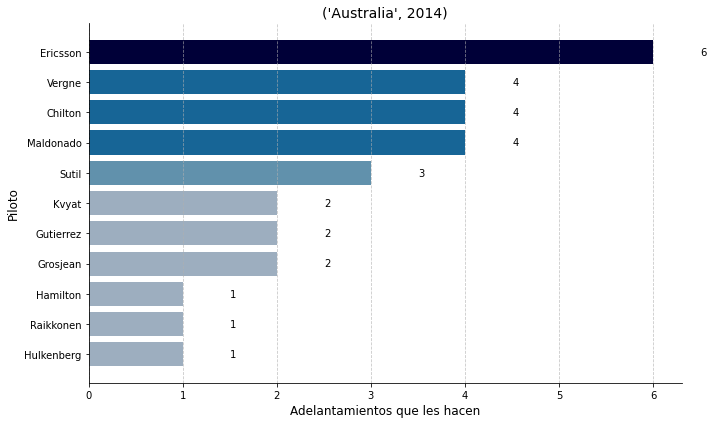

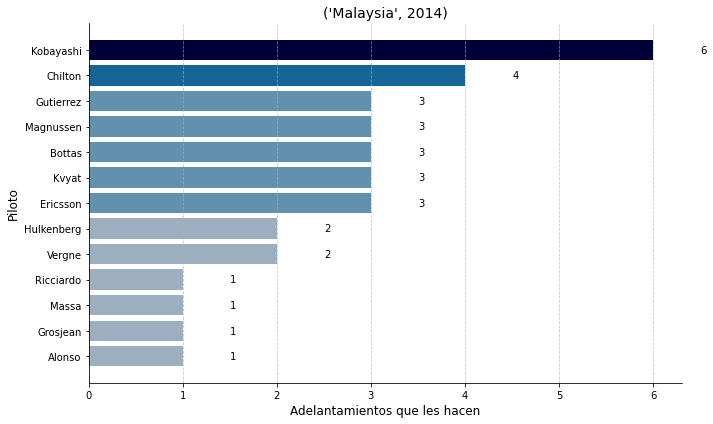

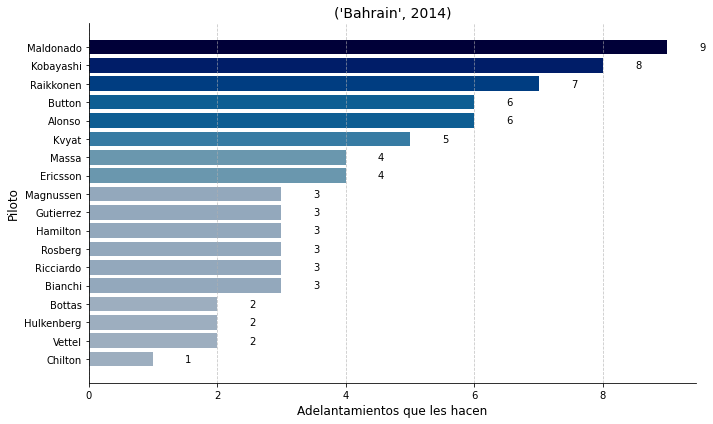

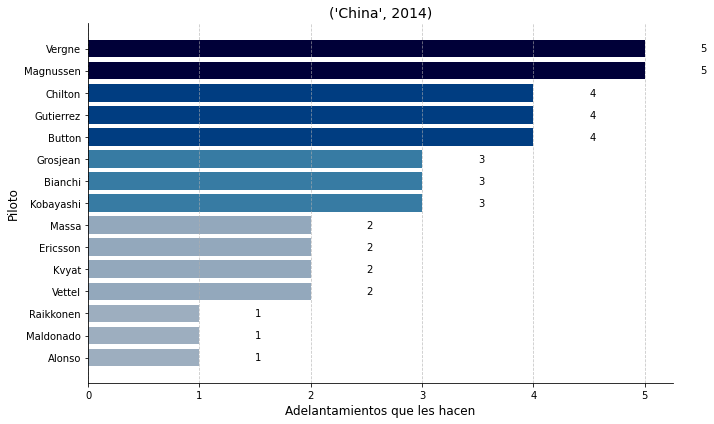

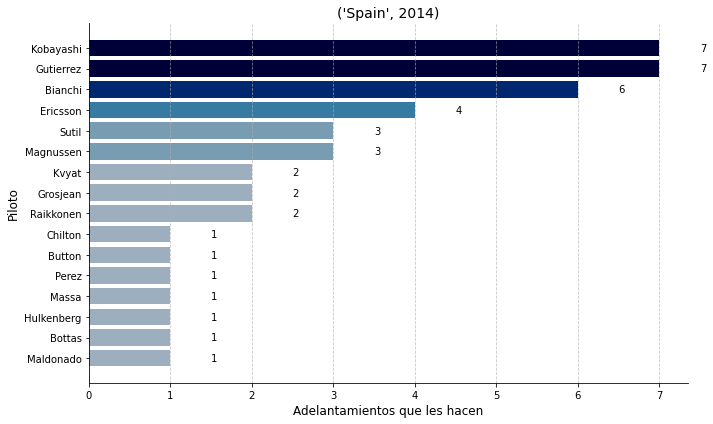

...

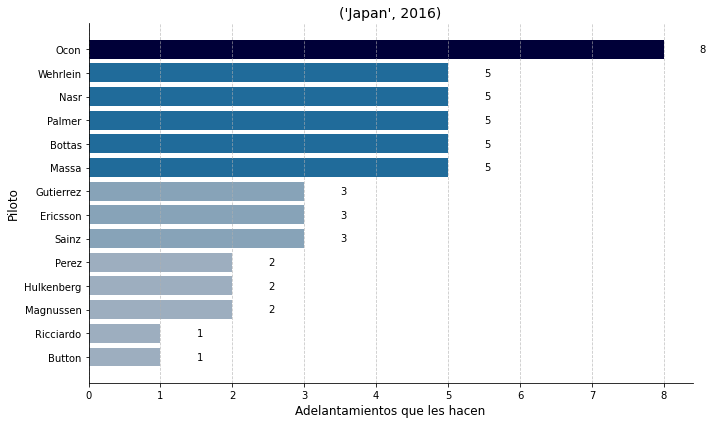

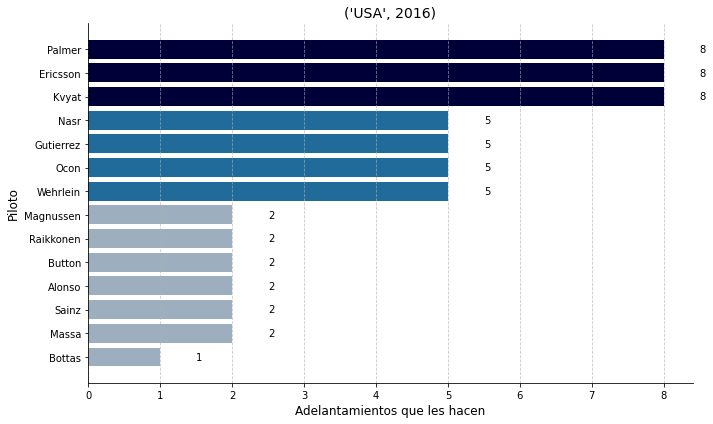

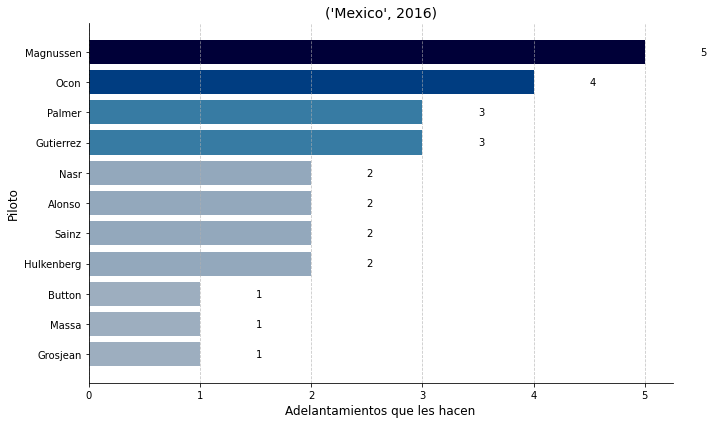

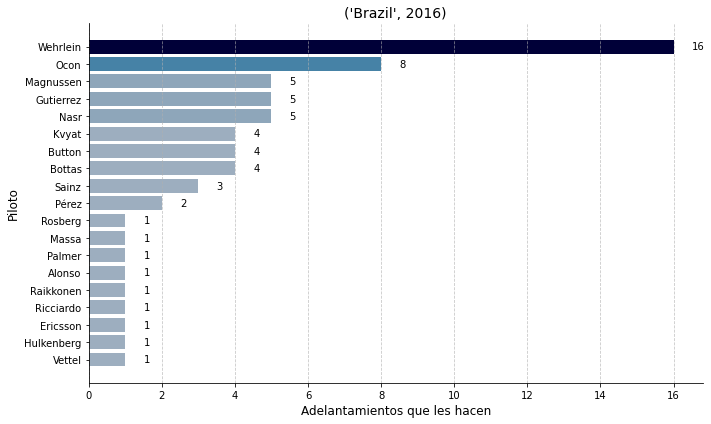

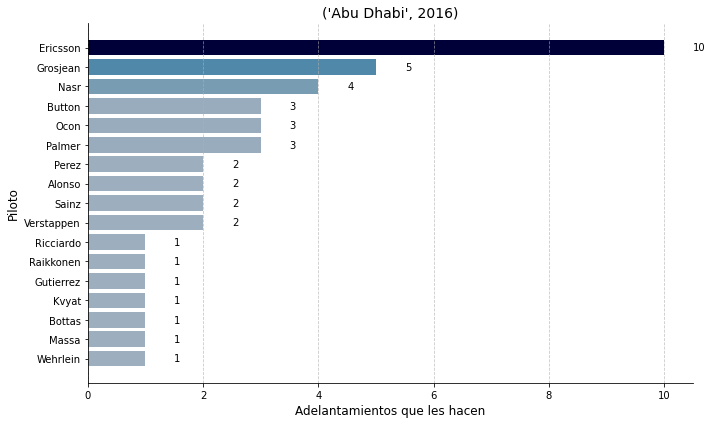

C:\Users\serto\AppData\Local\Temp/ipykernel_9956/3414160038.py:32: RuntimeWarning: invalid value encountered in true_divide
  normalized_values = (h.values - np.min(h.values)) / (np.max(h.values) - np.min(h.values))


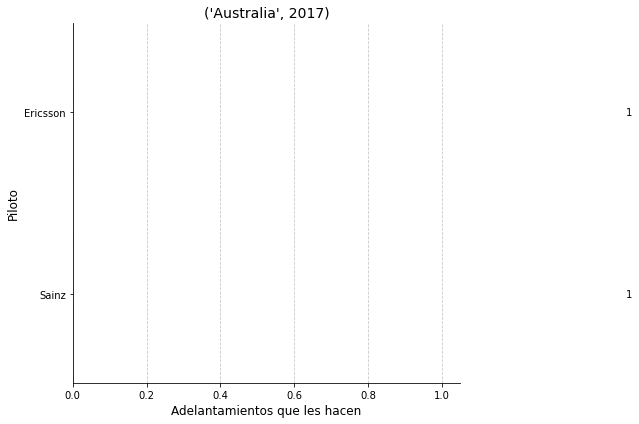

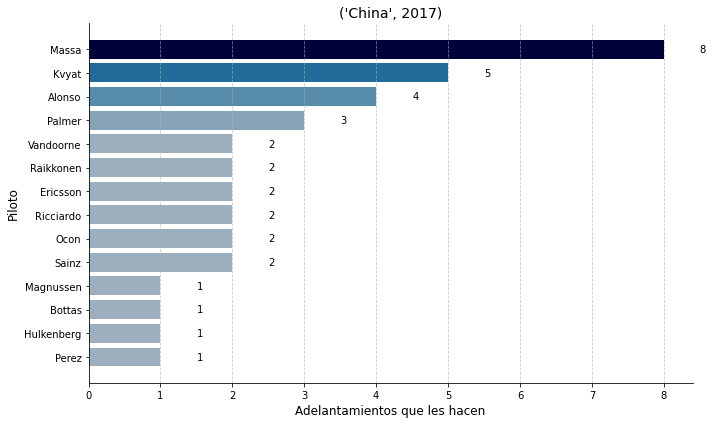

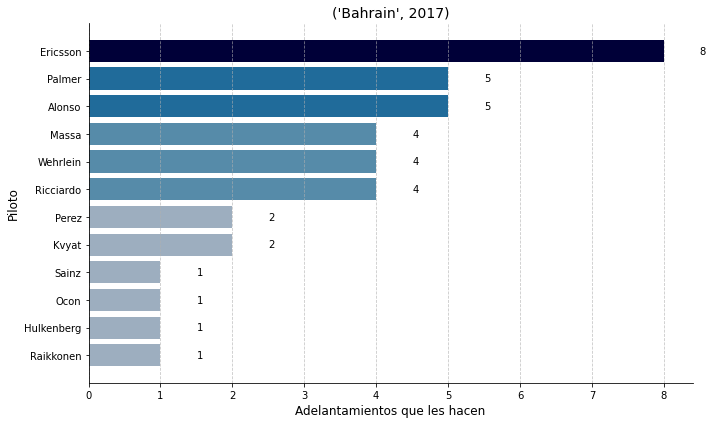

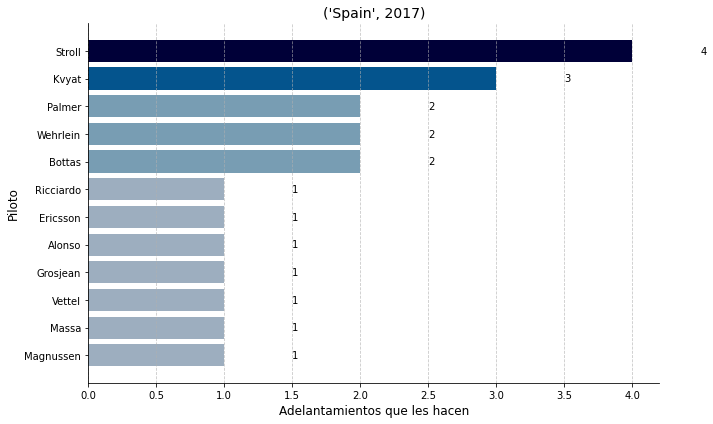

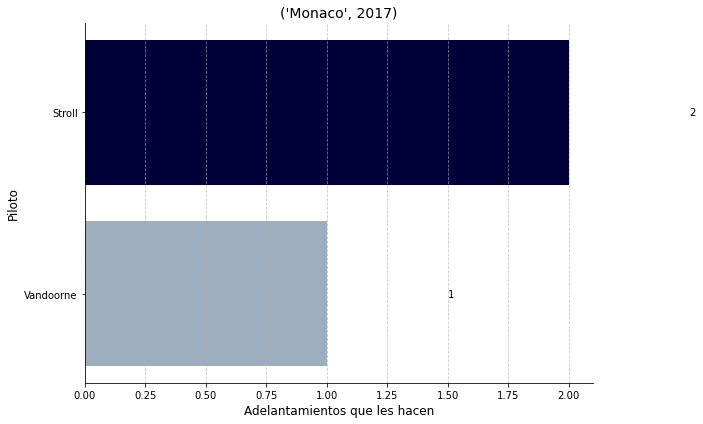

...

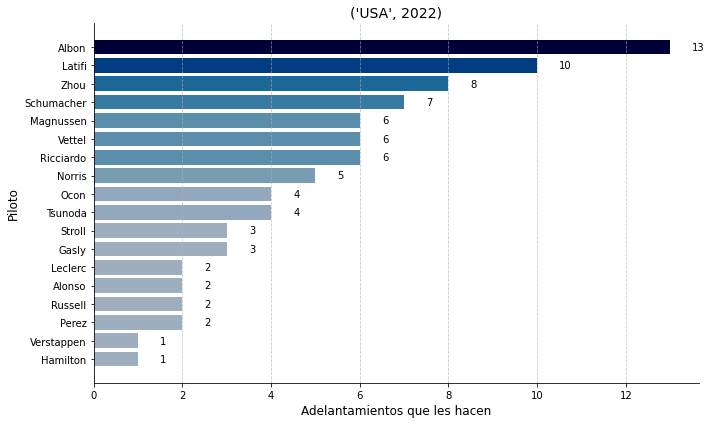

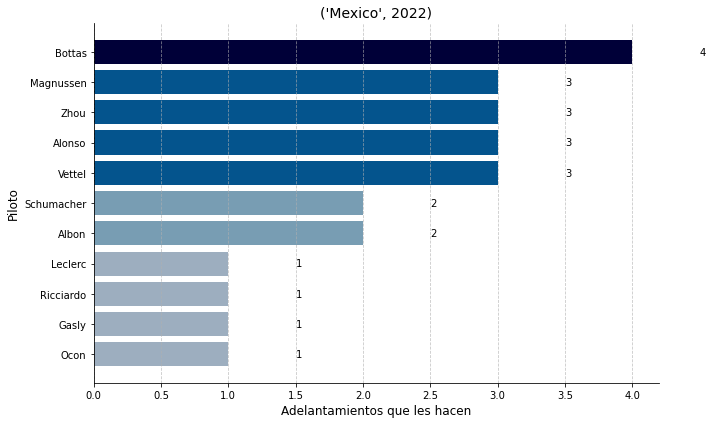

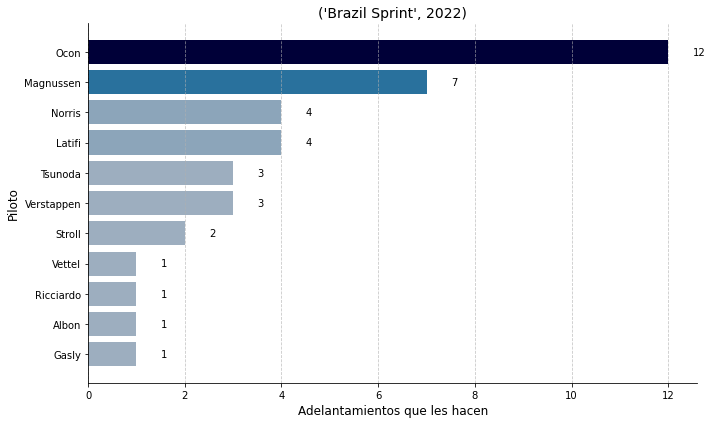

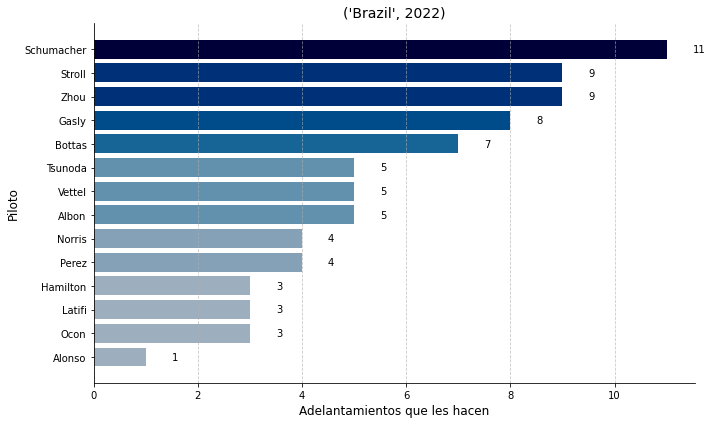

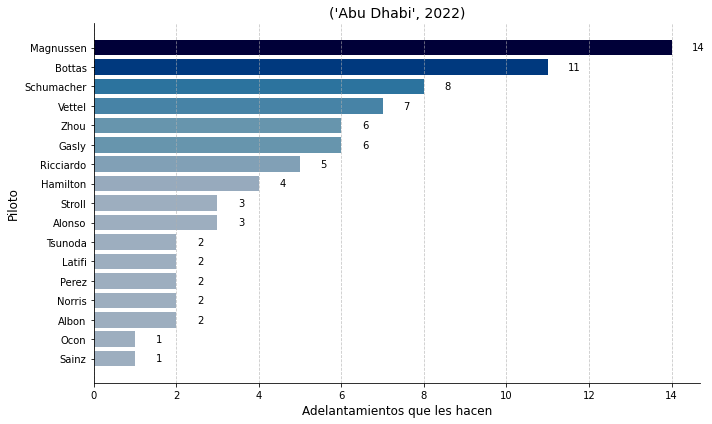

In [22]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

years = range(2014, 2023)  # Lista de años desde 2014 hasta 2022

# Crear un DataFrame vacío
df = pd.DataFrame()

# Leer y combinar los datos de cada año en el DataFrame
for year in years:
    filename = f"{year}_overtakes.csv"
    df_year = pd.read_csv(filename, delimiter=',')
    df_year['Año'] = year
    df = df.append(df_year)

# Crear una lista de nombres de carreras únicas para cada año
for year in years:
    df_year = df[df['Año'] == year]
    races = df_year['Race'].unique()

    # Generar gráficos de barras horizontales para cada carrera
    for race in races:
        frequencies = df_year[df_year['Race'] == race]
        h = frequencies['Overtaken'].value_counts()

        # Crear una figura y un eje
        fig, ax = plt.subplots(figsize=(10, 6))

        # Personalizar el gráfico de barras horizontales
        color_palette = 'Blues'  # Paleta de colores
        normalized_values = (h.values - np.min(h.values)) / (np.max(h.values) - np.min(h.values))
        min_bar_height = 0.2  # Tamaño mínimo de la barra
        heights = np.maximum(normalized_values, min_bar_height)
        adjusted_colors = plt.cm.get_cmap(color_palette)(heights)
        adjusted_colors[:, :3] -= 0.2
        adjusted_colors = np.clip(adjusted_colors, 0.0, 1.0)
        ax.barh(h.index, h.values, color=adjusted_colors)

        # Personalizar el título y las etiquetas de los ejes
        ax.set_title((race, year), fontsize=14)
        ax.set_xlabel('Adelantamientos que les hacen', fontsize=12)
        ax.set_ylabel('Piloto', fontsize=12)

        # Personalizar ajustes adicionales
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.grid(axis='x', linestyle='--', alpha=0.7)
        ax.invert_yaxis()

        # Añadir valores en las barras
        for i, v in enumerate(h.values):
            ax.text(v + 0.5, i, str(v), color='black', ha='left', va='center', fontsize=10)

        plt.tight_layout()
        plt.show()


C:\Users\serto\AppData\Local\Temp/ipykernel_9956/437544052.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(10, 6))  # Aumentar el tamaño de la figura


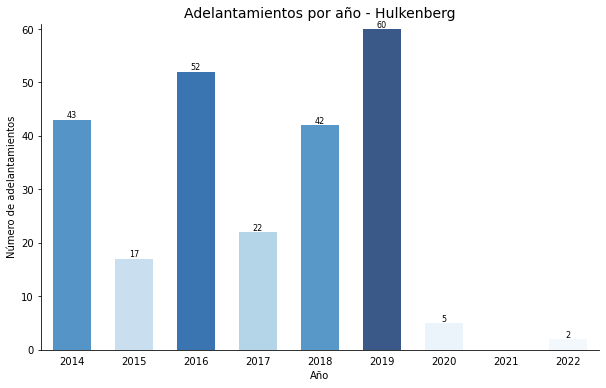

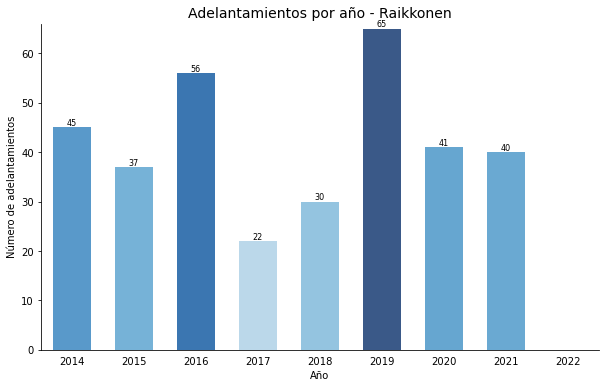

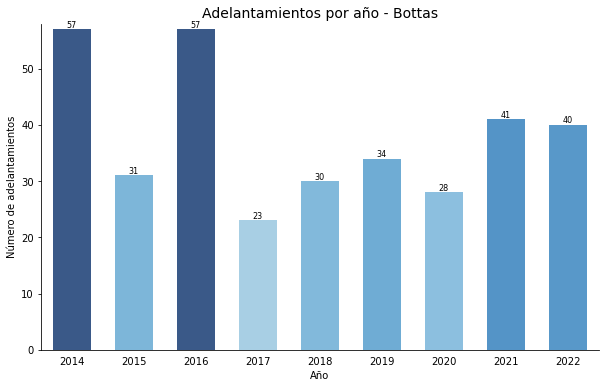

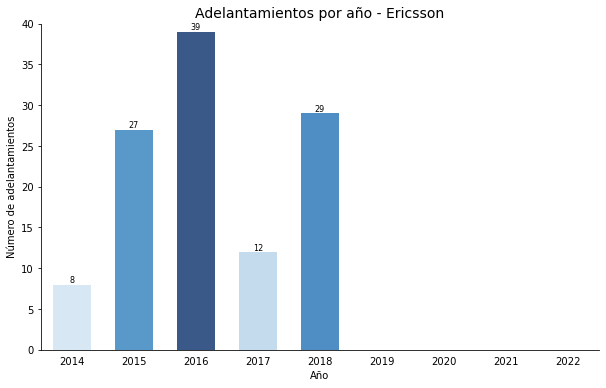

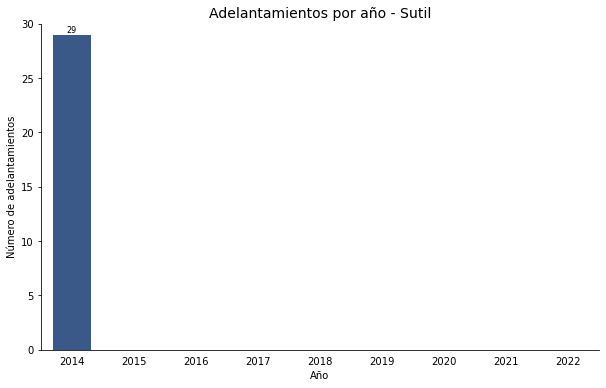

...

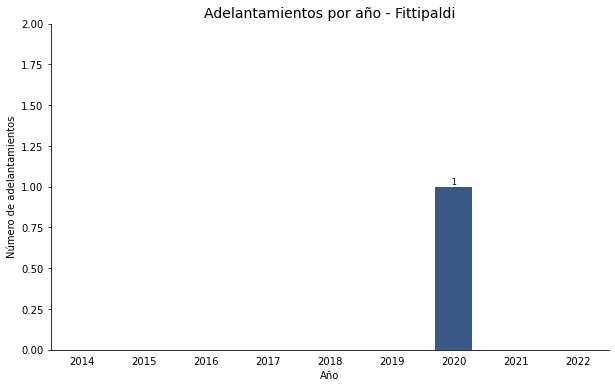

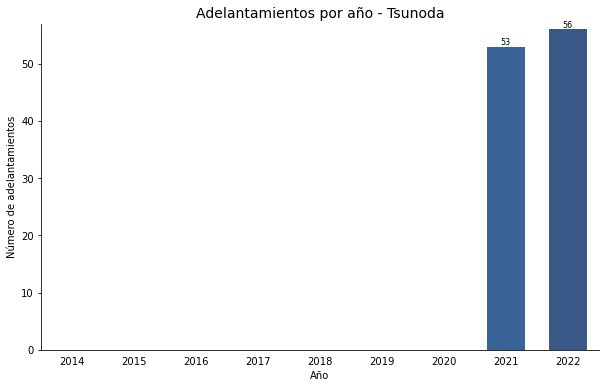

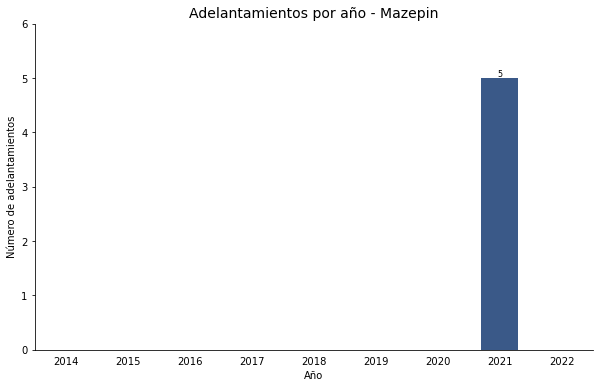

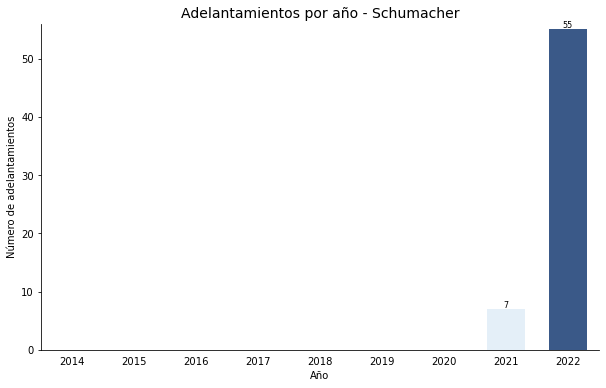

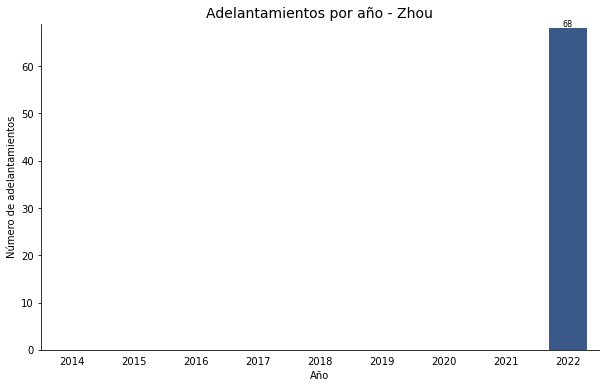

In [23]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Leer los datos de adelantamientos para cada año y almacenarlos en DataFrames
years = range(2014, 2023)
dfs = []

for year in years:
    filename = f'{year}_overtakes.csv'
    df = pd.read_csv(filename, delimiter=',')
    df['Año'] = year
    dfs.append(df)

# Combinar todos los DataFrames en uno solo
df = pd.concat(dfs)

# Obtener la lista de pilotos únicos
lista_pilotos = df['Overtaker'].unique()

# Configuración de colores para las barras
colormap = plt.cm.get_cmap('Blues')  # Paleta de colores (se puede cambiar a otra)

# Generar un gráfico para cada piloto
for piloto in lista_pilotos:
    frequencies = df[df['Overtaker'] == piloto]['Año'].value_counts().sort_index()

    # Configuración de la figura y los ejes
    fig, ax = plt.subplots(figsize=(10, 6))  # Aumentar el tamaño de la figura

    # Barra de colores basada en el número de adelantamientos
    colors = colormap(frequencies.values / max(frequencies.values))

    # Gráfico de barras con ajustes para mostrar todos los años
    ax.bar(frequencies.index, frequencies.values, color=colors, alpha=0.8, width=0.6)

    # Configuración de los ejes y el título
    ax.set_xlabel('Año')
    ax.set_ylabel('Número de adelantamientos')
    ax.set_title(f'Adelantamientos por año - {piloto}', fontsize=14)  # Aumentar el tamaño del título

    # Ajustar el tamaño de las gráficas para mostrar todos los años y adelantamientos
    ax.set_xlim(min(years) - 0.5, max(years) + 0.5)
    ax.set_ylim(0, max(frequencies.values) + 1)

    # Mostrar los valores de los años en el eje x y eliminar los ticks sobrantes
    ax.set_xticks(years)
    ax.set_xticklabels(years)  # Mostrar los años en el eje x
    ax.tick_params(axis='x', which='both', bottom=False, top=False)
    ax.xaxis.set_tick_params(width=0)

    # Añadir el año correspondiente debajo de cada barra
    for x, y in zip(frequencies.index, frequencies.values):
        ax.annotate(y, (x, y), ha='center', va='bottom', fontsize=8)
        ax.annotate(x, (x, -0.3), ha='center', va='top', fontsize=8, color='gray')  # Añadir el año debajo de la barra

    # Eliminar los ticks del eje y derecho y las etiquetas del eje xdata:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAl4AAAGECAYAAADnbC5SAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjQuMywgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/MnkTPAAAACXBIWXMAAAsTAAALEwEAmpwYAAAuZklEQVR4nO3deZhcdZn3//dNAhEiISwhsgeQQZFNDAohCW0AQUWSQXEMixHR6CMw6Iw/gyMg6OMzIMol4gbiggs6oAKBETSJCasDJBAgELbRCMgSEDRshiTcvz/O6VC03Ul1UnWqu/r9uq666pxTp865v3Wquz/9PVtkJpIkSWq+dVpdgCRJ0kBh8JIkSaqIwUuSJKkiBi9JkqSKGLwkSZIqYvCSJEmqiMFLqlNEvC8ienX9lYiYExHfaFZNVYiI0yNiQavraCcRcWpEPB0RH4qIT0bEp1tdU290/U5ExA8j4qp655cGMoOXBqyIeHNErIiIG1tdS2+Uf6yfq3CVXwH2b+QCI2JURGREjG7kcvuRScDBwBHAR4FfVLHSMiBl+VgeEQ9FxLcjYuNeLqrh3wlpoBjc6gKkFvoo8C3ggxHxxsxc2OqC+qLMfA6oMuj1eRGxXma+tKbvz8y3lIPvblBJvTETOIbi9/8uwPeB4cDkehfgd0Jac/Z4aUCKiPWBI4HvUvQ2HNfNPB+MiD9FxAvlbpSR3czznoiYFxF/j4g/RsSXImK9Vaz36Ii4NSKejYjFEXFpRGxV83pH2RtxQETcXK57bkTs1fk68ANgaE3Pxem9XPY7y5pfjIjrI2LriNg/Iu6IiOci4qqI2LTmff+wmygijo2Ie8p23x8Rn4qIdWpez4iYWtbwfET8ISKOrlnEH8vnW8t555TvW6fcDfdwRCyNiLsiYmKXdZ9WbpelEfF4RPxoFZ93Z5sPjYj5Zb3zIuItXeY7vFzX0nLdn4uIqHl9Ufk5fD8i/gr8tIf17R0Rv42IpyJiSUTcEBH7dplndZ8NEbFbRMwst9HTZU/VRj21s5eWZubjmflIZv4W+C/gHTXrHhQR3yu/zy9GxAMR8Zku23eVuw4jYo+IeCwivtTD69tGxL0RcVFEDI6IjcvhZ8p1zoyIN9XM/6Hyu3lARCwoP7fZEbF9l+Wu8uex3I6nRMT55fZ5JCL+vzX7GKU1lJk+fAy4B8V//HeUwx3AYmDdmtffBrwMfA74J+BjwF+KH5mV8xwMLAGOBXYE3g7cB3ylZp45wDdqxj8MvAvYAXgrMBu4rub1DiCBW8rlvQH4DbAQCGA94CTgeeB15eO1a7DsccDuwALgRmBW2ebRFKHovJr3nQ4sqBn/KPAY8D5ge+A9wOPACTXzJPAIcDTweuA/gZeA7crX9y7nObhswybl9E+Vn+mR5ef+BWAFsGf5+nvL198NbFvWe8IqtnNnm+8t17UrcGlZ7wblPG8p13FGuc6jKHpzTqxZzqJyvZ8p27NTD+ubQPHdemO57b4BPANs1ovPZgPgz8DlwG4Uu/TuB37ZgO/9D4GrasZ3AO4GHq+Ztm75ue8NjALeD/wVOG4V34mVyy2/W08Dn+pu/vKzeRg4B4hy2hXlNhpftnl6Oc/65esfApZR9Na9leK7ezvwm17+PC6i+Dk+ofzsTyy3x76t/p3kY+A8Wl6ADx+teADXAp8uh6P8hfzemtcvBmZ0ec+FvDp4XQec2mWeSeUf7c4/KHOoCV7d1PGG8hf/1uV4Rzl+cM08+3WZ50PAc3W0sZ5ln1BO26tmWtc/ql3HHwKO6bKuTwL31Iwn8J8144OBF4Cjy/FR5Tyjuyznz8BpXabNAX5SDv9b+cd03dW1v0ubj6qZ9lqKIPGRcvynwO+6vO904JGa8UXAlWvwPQuKkHp0Lz6bjwJ/Azbsph2vX8vv/Q+B5eV39MVymUlNSOrhfWcCM1fxnfghcBVwKEX4+WA3n+cCitD0FPC5mtd2KmsYXzNto/Iz6NxGHyrn2blmnqMoAus6vfh5XAT8rMs8DwCnrM3n6sNHbx7uatSAExGvpwgzF0OZpIo/vh+pme2NwO+7vLXr+FuAz5W7QJ6L4oD3i4GhFL043a17r4i4otxV9iwwt3xp2y6z3lkz/Gj5vPlq2rUmy36ifL6ry7Ru1xURI4BtgPO7tPtMil6GbteTmcuBJ1fVhogYBmxJ0QNX6waKY5Gg6K16DfDHcnfYERExpKdl1li57bI4PumummW+sYd1blXW1GkuqxERm5e7se6PiL8Bz1K0ucdt0M1n80bgzsx8tmb+myh6YHehGxFxdc32uHs1ZV4H7EkRgs4Dfg18vcvyPh7FLu4ny+37qW7a0NVbgMsoesa62/27FUXP6lmZWbsL8o1l22q30d949TaCYhfpfTXjj1L0zg2vWX89P4+13//O5azyZ0tqJA+u10D0EWAQ8FDtYTwAEbFNZj7cOb4a61Dsnrq0m9ee7DohIoZS7DbsPLh5MbAZcD3FLsRay2qGOy9h0eM/Smu77MzsOq2ndXVO/zhFGFiVZV3GV7XcrvN1Oy0zH46InYEDgAOBrwKfj4i3ZebzdSy7O9HDOrvWUs/yL6I4FvBTFL0rSynCxqq2Qed6Oj+beuup9RFg/R6W3dULmflgOfyvETEbOJWiV4qI+Bfga8CnKbbxEuB44J9Xs9w/UnzvPhwR0zNzaZfXn6L4TD4QERdm5jPl9FX9rNW2d3kPr61T81zPz+Oafi+lhvDLpgElIgYDU4DPUvzX3/nYg+I/4WPLWe8B9uny9q7jtwFvyMwHu3l0/SMBxa6/zYD/yMzrMvNe1uw/7ZcogmMzlr1KmfkExe7AHbtrdy8W1XlG4Mp2ZOYSit6HsV3mHUuxPTrn+3tm/ndmforiOKQ3UfRgrsrKbVeG1F0pjpujXHZ363ykS69TPcZSHB/335l5N0WP1xa9XMY9wB4RsWHNtDEUv6+7PfM2M/9csx3+1Mv1nQFMi4gty/GxwM2Z+Y3MvK3crl17M7vzNEUg3hK4rJueyKXAYRTHvM2IVy5hcQ9F21aehFD2NO5GzXavQ29/HqWWMHhpoHk3RUD5bmYuqH0AP6f4b30dil0vB0bEZyNip4j4KP/4H/8XgCMj4gsRsWtEvCGKi6x+uYd1P0Txx+eEiNghIt4NfHEN2rAIeE1EHBQRm0XEBg1cdj1OBz4TxZmMO5dt/2BEfLYXy1hMcYzRwRExsuaMvbOBT0fE5Ij4p4j4AsXB2l+FlWe3fSSKs/62pwjKyyiO01mVU8rP600Ul094iXJXc7ns/csz9f4pIo4C/h3oaTuuyv3A0RGxS0TsTfGd6u1lJ35K0bv2o7Kd44HzgV/1MtzWJTPnUBxgf0o56X5gryjOft0pIk6lzmt2ZeZTFOFra+BXXcNXZr5IcTLG3yjC1/DMfIDi4PrzI2JcROwG/ISip+1i6tfbn0epJQxeGmiOA2Zn5l+6ee1SYDvgwMz8n3Le/0PRE3Y45a6YTpn5G4og93aKMwVvAU6mCEH/IDOfpOhtm0Txn/znKQ4W75XMvAn4DvAzil0on2nUsutc/4UUZ1AeA9xBsTtzKq9cIqKeZSwH/pViF9mjFH94oQi8Z1OEngUUYfe9mTm/fP2vFNvl+vL19wKHZ+bq1n0yRcC6jeJg7kM7d01m5m0UFzJ9b7nMM8vHmtxx4MMUB+/Powhd36cIynXLzBcoztAbRvGduoLi+KcPr0E99ToHOC4itqMIeZdQhJ5bKU6E+Gq9CyrD1wSKYwF/2UP4OpSa8EURoG+hOJvxFoozOw8p5613vb36eZRapfNMD0lqO1Fc92w2MKIMBJLUUvZ4SZIkVcTgJUltrjwGb1YUN23fKiL+Vg7PiYhNWl2fNJB4OQlJbas8cLyeS4O0rShuG7V/Zh5QM+2uzOxoXVXSwGWPlyS1t4OBQWWP13kRMQh4YxT36Twzai5mJ6n5DF6S1N5GAuuVPV4vABMpzuwcD2xMcXkHSRXpF7saDznkkLzmmmtaXYYk9Tvf/OY3GTRoEMDka665hrlz5/K5z30OgKuvvprbb799aksLlNpTjz3J/aLH66mnPAtcktbEmDFjuPPO4vaE8+fPZ9SoUaxYsQKAG2+8kR13rOei9JIapV/0eEmS1syee+7J+uuvT0dHB5ttthlvf/vb2XvvvRk6dCg77LADZ5xxRqtLlAaUfnEB1dGjR+fcuXNbXYYkSVI9+veuRkmSpHbgrkZJ6gf2O/KsVpfQrRsvntbqEqR+xR4vSZKkihi8JEmSKmLwkiRJqojBS5IkqSIGL0mSpIoYvCRJkipi8JIkSaqIwUuSJKkiBi9JkqSKGLwkSZIqYvCSJEmqiMFLkiSpIgYvSZKkihi8JEmSKmLwkiRJqojBS5IkqSIGL0mSpIoYvCRJkipi8JIkSaqIwUuSJKkiTQ1eETE8In4REfdGxMKI2DciNomIGRHxQPm8cTNrkCRJ6iua3eN1LnBNZr4B2ANYCJwMzMrMnYBZ5bgkSVLba1rwiohhwHjgewCZ+VJm/hWYCFxUznYRMKlZNUiSJPUlzezx2gF4EvhBRNweERdGxFBgZGY+BlA+b97dmyNiakTMjYi5Tz75ZBPLlCRJqkYzg9dgYC/g25n5ZuB5erFbMTMvyMzRmTl6xIgRzapRkiSpMs0MXo8Aj2TmzeX4LyiC2BMRsQVA+by4iTVIkiT1GU0LXpn5OPBwROxcTjoAuAeYDkwpp00BrmhWDZIkSX3J4CYv/0TgpxGxHvAH4FiKsHdJRBwHPAQc0eQaJEmS+oSmBq/MnA+M7ualA5q5XkmSpL7IK9dLkiRVxOAlSZJUEYOXJElSRQxekiRJFTF4SZIkVcTgJUmSVBGDlwasRYsWMXLkSDo6OnjHO94BwIwZM5gwYQIdHR3MmzevxRVKktpNsy+gKvVpBx10ED/5yU8AePHFFzn//POZMWMGgwYNanFlkqR2ZPDSgDZ79mzGjRvH4Ycfzh577ME666zDO9/5TkaOHMl3vvMdhg4d2uoSJUltxF2NGrC22GIL7r//fmbPns3MmTO5/vrreeyxx7j66qsZM2YM559/fqtLlCS1GXu8NGANGTKEIUOGAHDooYey0UYb8fe//51BgwYxYcIEvvKVr7S4QklSu7HHSwPWs88+u3L4xhtvZMcdd2ThwoUAzJ8/n+23375VpUmS2pQ9Xhqwrr/+ek499VSGDBnC2LFjedvb3sb+++/P+PHj2WCDDbj44otbXaIkqc1EZra6htUaPXp0zp07t9VlSFLL7HfkWa0uoVs3Xjyt1SVIfVH09II9Xur3xk6b3uoSunXDWYe1ugRJUh/jMV6SJEkVMXhJkiRVxOAlSZJUEYOXJElSRQxekiRJFTF4SZIkVcTgJUmSVBGDlyRJUkUMXpIkSRUxeEmSJFXE4CVJklQRg5ckSVJFDF6SJEkVMXhJkiRVxOAlSZJUEYOXJElSRQxekiRJFTF4SZIkVcTgJUmSVBGDlyRJUkUMXpIkSRUxeEmSJFXE4CVJklQRg5ckSVJFDF6SJEkVGdzMhUfEIuBZYAWwPDNHR8QmwH8Bo4BFwPsz85lm1iFJktQXVNHj9fbM3DMzR5fjJwOzMnMnYFY5LkmS1PZasatxInBROXwRMKkFNUiSJFWu2cErgd9GxLyImFpOG5mZjwGUz5s3uQZJkqQ+oanHeAH7ZeajEbE5MCMi7q33jWVQmwqw7bbbNqs+SZKkyjS1xyszHy2fFwOXAW8FnoiILQDK58U9vPeCzBydmaNHjBjRzDIlSZIq0bTgFRFDI2LDzmHgHcACYDowpZxtCnBFs2qQJEnqS5q5q3EkcFlEdK7n4sy8JiJuBS6JiOOAh4AjmliDJElSn9G04JWZfwD26Gb6X4ADmrVeSZKkvsor10uSJFXE4CVJklQRg5ckSVJFDF6SJEkVMXhJkiRVxOAlSZJUEYOXJElSRQxekiRJFTF4SZIkVWS1wSsiToqIYVH4XkTcFhHvqKI4SZKkdlJPj9eHM3MJxU2uRwDHAmc2tSpJkqQ2VE/wivL5XcAPMvOOmmlt6ZxzzmHs2LEAbLTRRnR0dNDR0cHTTz/d4sokSVJ/Vs9NsudFxG+B7YHPRsSGwMvNLat1li5dyh133LFyfLfddmPOnDmtK0iSJLWNenq8jgNOBvbOzBeA9Sh2N7alCy+8kClTpqwcX7hwIePGjePkk08mM1tYmSRJ6u9WG7wy82Vga+CUiPgKMCYz72x6ZS2wbNkyrr32WiZMmLBy2gMPPMB1113HM888w5VXXtnC6iRJUn9Xz1mNZwInAfeUj3+NiP9sdmGt8OMf/5gjjzzyVdM22WQTIoJJkyaxYMGCFlUmSZLaQT27Gt8FHJSZ38/M7wOHAO9ublmtcd999/Htb3+bQw45hLvvvptzzz2XFStWAHDjjTey4447trhCSZLUn9VzcD3AcKDzlL6NmlNK65111lkrh8eOHcv+++/P3nvvzdChQ9lhhx0444wzWlidJEnq7+oJXv8J3B4RsykuIzEe+I+mVtUH3HDDDQDcdtttLa5EkiS1i9UGr8z8WUTMAfamCF7TMvPxZhe2No684NZWl9Cti6fu3eoSJElSC9VzcP2szHwsM6dn5hWZ+XhEzKqiOEmSpHbSY49XRLwG2ADYLCI25pWr1Q8DtqygNkmSpLayql2NHwM+SRGy5vFK8FoCfLO5ZUmSJLWfHoNXZp4LnBsRJ2bmeRXWJEmS1JbqObj+vIgYA4yqnT8zf9TEuiRJktrOaoNXRPwY2BGYD6woJydg8JIkSeqFeq7jNRrYJb1DtCRJ0lqp55ZBC4DXNbsQSZKkdldPj9dmwD0RcQuwtHNiZh7WtKokSZLaUD3B6/RmFyFJkjQQ1HNW47URsR2wU2bOjIgNgEHNL02SJKm91HPLoI8CvwDOLydtBVzexJokSWqIc845h7Fjx7Js2TL23XdfXvva1/Lggw+2uiwNYPUcXH88sB/FFevJzAeAzZtZlCRJa2vp0qXccccdAAwePJjLL7+c973vfS2uSgNdPcFraWa+1DkSEYMpruMlSVKfdeGFFzJlyhQAIoKRI0e2uCKpvuB1bUT8B7B+RBwEXApc2dyyJElac8uWLePaa69lwoQJrS5FepV6gtfJwJPAXRQ3zv41cEozi5IkaW38+Mc/5sgjj2x1GdI/WG3wysyXM/O7mXlEZr6vHHZXoySpz7rvvvv49re/zSGHHMLdd9/Neeed1+qSKtV5UgHA2WefzdixYznqqKNYtmxZiytTj8ErIi4pn++KiDu7PqorUZKk3jnrrLP4zW9+wzXXXMOb3vQmTjzxRN7//vfz29/+lilTpnDFFVe0usSmqT2p4Mknn2T27NnccMMN7L777lx++eWtLU6rvI7XSeXzoVUUIklSM9xwww0AXHLJJS2upBqdJxWcdtpp3HLLLXR0dABw4IEHcvHFF3PEEUe0tsABrsfglZmPlc9/AoiIYauaX5KkRvvYz+5odQndOn/yHq0uoVudJxUcf/zxnHbaafz1r39l2LBhAGy00UY888wzLa5Qqw1SEfEx4AvAi7xyGYkEdmhiXZIkqZe6nlQwfPhw/vznPwOwZMkShg8f3qLK1Kmesxo/DbwpM0dl5vblo+7QFRGDIuL2iLiqHN8kImZExAPl88ZrWrwkSXpF15MK5s6dy7XXXgvAzJkz2WeffVpcoeoJXv8LvLAW6zgJWFgzfjIwKzN3AmaV45IkaS11Pang85//POPHj2fs2LHMnz+fSZMmtbrEAa+eY7Y+C9wUETcDSzsnZua/ru6NEbE18G7gS8C/lZMnAh3l8EXAHGBa3RVLkqTV6jypYNq0aUyb5p/ZvqKe4HU+8DuKC6i+3Mvlfw34DLBhzbSRNQfuPxYR3d73MSKmAlMBtt12216uVpKk/uv4S+5qdQnd+ub7d2t1Cf1ePcFreWb+2+pne7WIOBRYnJnzIqKjt+/PzAuACwBGjx7tBVslSVK/V0/wml32Pl3Jq3c1Pr2a9+0HHBYR7wJeAwyLiJ8AT0TEFmVv1xbA4jWsXZIkqV+p5+D6IymP8wLmlY+5q3tTZn42M7fOzFHAB4DfZebRwHRgSjnbFKB9Lx8sSZJUY7U9Xpm5fYPXeSZwSUQcBzwEeAldSZI0INR1JfqI2BXYhWKXIQCZ+aN6V5KZcyjOXiQz/wIc0JsiJUmS2kE9V67/PMXlH3YBfg28E7gBqDt4SZIkqb5jvN5H0UP1eGYeC+wBDGlqVarUggULGDNmDOPGjePYY4/l9ttvp6Ojg46ODrbffnu+9rWvtbpESZLaQj3B68XMfBlYXt4oezHep7Gt7Lzzztx0001cf/31ACxfvpw5c+YwZ84cdt99dw499NAWVyhJUnuo5xivuRExHPguxRmNzwG3NLMoVWvdddddOTxkyBC22WYbAJ5//nkef/xxXv/617eqNEmS2spqe7wy8xOZ+dfM/A5wEDCl3OWoNjJ9+nR23XVXFi9ezKabbgrA1VdfzSGHHNLiyiRJah+rDV4RMatzODMXZeadtdPUHg477DAWLFjAVlttxVVXXQXAZZddxuGHH97iyiRJah897mqMiNcAGwCbRcTGQJQvDQO2rKA2VWTp0qUMGVKcLzFs2DDWX399li1bxsKFC9ljjz1aXJ0kSe1jVcd4fQz4JEXImscrwWsJ8M3mlqUqXXPNNZxzzjkA7LTTTrzjHe9gxowZTJgwocWVSZLUXnoMXpl5LnBuRJyYmedVWJMqNnHiRCZOnPiqaQcffDAHH3xwiyqSJKk91XPLoPMiYgwwqnb+3ly5XtWYduW9rS6hW2e95w2tLkGSpD6hnivX/xjYEZgPrCgnJ165XpIkqVfquY7XaGCXzMxmFyNJktTO6rly/QLgdc0uRJIkqd3V0+O1GXBPRNwCLO2cmJmHNa0qSZKkNlRP8Dq92UVIkiQNBPWc1XhtFYVIkiS1u3puGbRPRNwaEc9FxEsRsSIillRRnCRJUjup5+D6bwCTgQeA9YGPlNMkSZLUC/Uc40VmPhgRgzJzBfCDiLipyXVJkiS1nXqC1wsRsR4wPyK+DDwGDG1uWZIkSe2nnl2NxwCDgBOA54FtgPc2syhJkqR2VM9ZjX8qB18EzmhuOZIkSe2rx+AVEXdR3JOxW5m5e1MqkiRJalOr6vE6tLIqJEmSBoAeg1fNLkYiYjtgp8ycGRHrr+p9kiRJ6l49F1D9KPAL4Pxy0tbA5U2sSZIkqS3Vc1bj8cB+wBKAzHwA2LyZRUmSJLWjeoLX0sx8qXMkIgazioPuJUmS1L16gte1EfEfwPoRcRBwKXBlc8uSJElqP/UEr5OBJ4G7gI8BvwZOaWZRkiRJ7aieC6i+DHy3fEiSJGkNeQFVSZKkitRzAdXjy+cfl89HAS80rSJJkqQ2tdoLqEbEfpm5X81LJ0fEjcAXml2cJElSO6nn4PqhETG2cyQixgBDm1eSJElSe6oneB0HfDMiFkXEIuBbwIebWpUkNdiCBQsYM2YM48aN49hjjyUzOfvssxk7dixHHXUUy5Yta3WJkgaA1QavzJyXmXsAuwN7ZOaemXlb80uTpMbZeeeduemmm7j++usBmDt3LrNnz+aGG25g99135/LLL29tgZIGhHp6vIiIdwMfB06KiNMi4rTmliVJjbXuuuuuHB4yZAj3338/HR0dABx44IH8z//8T4sqkzSQ1HOT7O8A/wKcCARwBLBdk+uSpIabPn06u+66K4sXL2b58uUMGzYMgI022ohnnnmmxdVJGgjq6fEak5kfBJ7JzDOAfYFtmluWJDXeYYcdxoIFC9hqq60YPHgwS5YsAWDJkiUMHz68tcVJGhDqCV4vls8vRMSWwDJg+9W9KSJeExG3RMQdEXF3RJxRTt8kImZExAPl88ZrXr4k1Wfp0qUrh4cNG8aKFSu49tprAZg5cyb77LNPq0qTNIDUE7yuiojhwNnAbcAi4Gd1vG8pMKE8MH9P4JCI2Ifi3o+zMnMnYFY5LklNdc0117D//vuz//7788QTT3D00Uczfvx4xo4dy/z585k0aVKrS5Q0ANRzr8YvloO/jIirgNdk5t/qeF8Cz5Wj65aPBCYCHeX0i4A5wLReVS1JvTRx4kQmTpz4qmnTpk1j2jR//UiqTl1nNXbKzKX1hK5OETEoIuYDi4EZmXkzMDIzHyuX9xiweW9qkCRJ6q9W2+O1NjJzBbBnuavysojYtd73RsRUYCrAtttu25wCJfU737zxT60uoVvH7+fJ3pJWr1c9XmsqM/9KsUvxEOCJiNgCoHxe3MN7LsjM0Zk5esSIEVWUKUmS1FT1XMcrIuLozoumRsS2EfHWOt43ouzpIiLWBw4E7gWmA1PK2aYAV6xh7ZIkSf1KPbsavwW8DEwAvgA8C/wS2Hs179sCuCgiBlEEvEsy86qI+D1wSUQcBzxEcUFWSZKktldP8HpbZu4VEbcDZOYzEbHe6t6UmXcCb+5m+l+AA3pdqSRJUj9XzzFey8peq4RiFyJFD5gkSZJ6oZ7g9XXgMmDziPgScAPw/5palSRJUhuq5wKqP42IeRS7BwOYlJkLm16ZJElSm+kxeEXEJjWji6m5TVBEbJKZTzezMEmSpHazqh6veRTHdQWwLfBMOTyc4mzE1d4oW5IkSa/o8RivzNw+M3cAfgO8JzM3y8xNgUOBX1VVoCRJUruo5+D6vTPz150jmXk1sH/zSpIkSWpP9VzH66mIOAX4CcWux6OBvzS1KkmSpDZUT4/XZGAExSUlLiuHJzezKEmSpHZUz+UkngZOqqAWSZKktlZPj5ckSZIawOAlSZJUEYOXJElSRVYbvCJi64i4LCKejIgnIuKXEbF1FcVJkiS1k3p6vH4ATAe2ALYCriynSZIkqRfqCV4jMvMHmbm8fPyQ4pISkiRJ6oV6gtdTEXF0RAwqH15AVZIkaQ3UE7w+DLwfeBx4DHhfOU2SJEm9sMoLqEbEIOD/ZeZhFdUjSZLUtlbZ45WZK4AREbFeRfVIkiS1rXpukr0IuDEipgPPd07MzHOaVZQkSVI7qid4PVo+1gE2bG45kiRJ7auem2SfARARQzPz+dXNL0mSpO7Vc+X6fSPiHmBhOb5HRHyr6ZVJkiS1mXouJ/E14GDKa3dl5h3A+CbWJEmS1Jbqukl2Zj7cZdKKJtQiSZLU1uoJXg9HxBggI2K9iPg05W5HSf3PzTffzJgxYxg3bhyf+tSn+OMf/8i4ceMYP348Rx55JCtW+H+VJDVLPcHr48DxFDfIfgTYsxyX1A9tt912/O53v+P6669n8eLFPPLII1x55ZVcd911bL/99vz6179udYmS1LbqOavxKeCoCmqRVIHXve51K4cHDx7MpptuyvDhw1eODxo0qEWVSVL7W23wiojtgROBUbXzexshqX+78847eeqpp9hll10AePTRR5k5cyannnpqiyuTpPZVzwVULwe+B1wJvNzUaiRV4umnn+aEE07gkksuAWDp0qVMmTKF7373uwweXM+vBUnSmqjnN+zfM/PrTa9EUiWWL1/O0Ucfzdlnn71yt+PUqVP5xCc+sbL3S5LUHPUcXH9uRHy+vJDqXp2PplcmqSkuvfRSbr31VqZNm0ZHRwe///3v+dWvfsW5555LR0cHl112WatLlKS2VU+P127AMcAEXtnVmOW4pH5m8uTJTJ48+VXTnn322RZVI0kDSz3B65+BHTLzpWYXI6l+M+97stUldOvAnUe0ugRJ6rPq2dV4BzC8yXVIkiS1vXp6vEYC90bErcDSzoleTkKSJKl36glen296FZIkSQNAPVeuv7aKQiRJktpdt8ErIjbIzBfK4WcpzmIEWA9YF3g+M4dVU6IkSVJ76KnH60MRsXFmfikzN6x9ISImAW9temWSJEltptuzGjPzW8CfIuKD3bx2OXVcwysitomI2RGxMCLujoiTyumbRMSMiHigfN54LdsgSZLUL/R4jFdm/gQgIg6vmbwOMJpXdj2uynLg3zPztojYEJgXETOADwGzMvPMiDgZOBmYtob1S5Ik9Rv1nNX4nprh5cAiYOLq3pSZjwGPlcPPRsRCYKvyvR3lbBcBczB4SZKkAaCesxqPXduVRMQo4M3AzcDIMpSRmY9FxOY9vGcqMBVg2223XdsSJEmSWq7H4BURp63ifZmZX6xnBRHxWuCXwCczc0lE1FVYZl4AXAAwevToenZtSpIk9WmrumXQ8908AI6jzl2DEbEuRej6aWb+qpz8RERsUb6+BbB4DeqWJEnqd1Z1cP1XO4fLg+NPAo4Ffg58taf31bwngO8BCzPznJqXpgNTgDPL5yvWqHJJkqR+ZpXHeEXEJsC/AUdRHAi/V2Y+U+ey9wOOAe6KiPnltP+gCFyXRMRxwEPAEWtQtyRJUr+zqmO8zgYOpzjOarfMfK43C87MG4CeDug6oDfLkiRJagerOsbr34EtgVOARyNiSfl4NiKWVFOeJElS+1jVMV6rCmWSJEnqJcOVJElSRQxekiRJFTF4SZIkVcTgJUmSVBGDlyRJUkUMXpIkSRUxeEmSJFXE4CVJklQRg5ckSVJFDF6SJEkVMXhJkiRVxOAlSZJUEYOXJElSRQxekiRJFTF4SZIkVcTgJUmSVBGDlyRJUkUMXpIkSRUxeEmSJFXE4CVJklQRg5ckSVJFDF6SJEkVMXhJkiRVxOAlSZJUEYOXJElSRQxekiRJFTF4SZIkVcTgJUmSVBGDlyRJUkUMXpIkSRUxeEmSJFXE4CVJklQRg5ckSVJFDF6SJEkVMXhJkiRVxOAlSZJUEYOXJElSRQxekiRJFWla8IqI70fE4ohYUDNtk4iYEREPlM8bN2v9kiRJfU0ze7x+CBzSZdrJwKzM3AmYVY5LkiQNCE0LXpl5HfB0l8kTgYvK4YuASc1avyRJUl9T9TFeIzPzMYDyefOeZoyIqRExNyLmPvnkk5UVKEmS1Cx99uD6zLwgM0dn5ugRI0a0uhxJkqS1VnXweiIitgAonxdXvH5JkqSWqTp4TQemlMNTgCsqXr8kSVLLNPNyEj8Dfg/sHBGPRMRxwJnAQRHxAHBQOS5JkjQgDG7WgjNzcg8vHdCsdUqSJPVlffbgekmSpHZj8JIkSaqIwUuSJKkiBi9JkqSKGLwkSZIqYvCSJEmqiMFLkiSpIgYvSZKkihi8JEmSKmLwkiRJqojBS5IkqSIGL0mSpIoYvCRJkipi8JIkSaqIwUuSJKkiBi9JkqSKGLwkSZIqYvCSJEmqiMFLkiSpIgYvSZKkihi8JEmSKmLwkiRJqojBS5IkqSIGL0mSpIoYvCRJkipi8JIkSaqIwUuSJKkiBi9JkqSKGLwkSZIqYvCSJEmqiMFLkiSpIgYvSZKkihi8JEmSKmLwkiRJqojBS5IkqSIGL0mSpIoYvCRJkipi8JIkSaqIwUuSJKkiBi9JkqSKtCR4RcQhEXFfRDwYESe3ogZJkqSqVR68ImIQ8E3gncAuwOSI2KXqOiRJkqrWih6vtwIPZuYfMvMl4OfAxBbUIUmSVKlWBK+tgIdrxh8pp0mSJLW1yMxqVxhxBHBwZn6kHD8GeGtmnthlvqnA1HJ0Z+C+SguVJElaM09l5iHdvTC46kooeri2qRnfGni060yZeQFwQVVFSZIkNVsrdjXeCuwUEdtHxHrAB4DpLahDkiSpUpX3eGXm8og4AfgNMAj4fmbeXXUdkiRJVav8GC9JkqSByivXS5IkVcTgJUmSVJEBF7wiYpuImB0RCyPi7og4qZy+SUTMiIgHyueNy+mblvM/FxHf6GGZ0yNiQZXt6K1Gtjsi5pS3fJpfPjZvRZvq0eB2rxcRF0TE/RFxb0S8txVtqkej2h0RG9Zs5/kR8VREfK1FzVqtBm/vyRFxV0TcGRHXRMRmrWhTPRrc7n8p23x3RHy5Fe2p1xq0+6CImFdu13kRMaFmWW8ppz8YEV+PiGhVu1anwe3+UkQ8HBHPtao99WpUuyNig4j47/L3+N0RcWalDcnMAfUAtgD2Koc3BO6nuHXRl4GTy+knA2eVw0OBscDHgW90s7zDgYuBBa1uW1XtBuYAo1vdpha0+wzg/5bD6wCbtbp9VbS7y3LnAeNb3b5mt5vixKPFndu4fP/prW5fBe3eFHgIGFGOXwQc0Or2NbDdbwa2LId3Bf5cs6xbgH2BAK4G3tnq9lXU7n3K5T3X6nZV1W5gA+Dt5fB6wPVVbu+Wf5CtfgBXAAdRXKB1i5qNe1+X+T7EP/4hfi1wQ7nh+3TwanC759BPgleD2/0wMLTVbai63TWv7VR+BtHq9jS73cC6wJPAdhR/iL8DTG11eypo997AzJrxY4Bvtbo9jW53OT2AvwBDynnurXltMnB+q9vT7HZ3md7ng1cz2l2+di7w0arqHnC7GmtFxCiKRHwzMDIzHwMon+vZffZF4KvAC82qsRka0G6AH5S7nk7ty13ytdam3RExvBz8YkTcFhGXRsTIJpbbMA3a3lD8MfqvLH9T9XVr0+7MXAb8H+Auigs87wJ8r5n1Nspabu8HgTdExKiIGAxM4tUXvO6z1qDd7wVuz8ylFLete6TmtX5zK7u1bHe/1ah2l7/b3wPMama9tQZs8IqI1wK/BD6ZmUvW4P17Aq/PzMsaXVszrW27S0dl5m7AuPJxTKPqa5YGtHswxV0WbszMvYDfA19pYIlN0aDt3ekDwM/Wvqrma8DP97oUwevNwJbAncBnG1pkE6xtuzPzGYp2/xfF7pdFwPJG1tgMvW13RLwJOAv4WOekbmbr8/9gNKDd/VKj2l3+c/Ez4OuZ+Ydm1NqdARm8yl+qvwR+mpm/Kic/ERFblK9vQXF8x6rsC7wlIhZR7G78p4iY05yKG6NB7SYz/1w+P0txfNtbm1NxYzSo3X+h6NnsDNqXAns1odyGadT2LufdAxicmfOaUmwDNajdewJk5v+WPXyXAGOaU3FjNPDn+8rMfFtm7kuxC+eBZtXcCL1td0RsTfFz/MHM/N9y8iMU/1h16vZWdn1Jg9rd7zS43RcAD2Tm15peeI0BF7zK3WLfAxZm5jk1L00HppTDUyj2HfcoM7+dmVtm5iiKg1Tvz8yOxlfcGI1qd0QMjvLsrvIH4FCgz57R2cDtncCVQEc56QDgnoYW20CNaneNyfSD3q4GtvvPwC4RMaIcPwhY2MhaG6mR2zvKs5TLM8M+AVzY2Gobp7ftLncr/Tfw2cy8sXPmcvfUsxGxT7nMD1L/z0blGtXu/qaR7Y6I/wtsBHyyuVV3o6qDyfrKgyIkJcWug/nl410UZ/PMovjvbhawSc17FgFPA89R/Ge0S5dljqKPH1zfqHZTnA01r1zO3RQHJQ5qdfuq2N4UB1pfVy5rFrBtq9tX1fcc+APwhla3q+Lt/XGKsHUnRejetNXtq6jdP6P4p+Ie4AOtblsj2w2cAjxfM+98YPPytdEU/0T+L/AN+vBJJA1u95fL7f9y+Xx6q9vX7HZT9Ghm+fPdOf0jVbXDWwZJkiRVZMDtapQkSWoVg5ckSVJFDF6SJEkVMXhJkiRVxOAlSZJUEYOXpLYVEf8cERkRb6iZtl9E3BQRV0TEh1pYnqQByMtJSGpbEXEJxU1zZ2Xm6S0uR5Ls8ZLUnsr7ue0HHEdxn0kioiMi5kTELyLi3oj4aedN3iPigIi4PSLuiojvR8SQFpYvqU0ZvCS1q0nANZl5P/B0RHTeW/PNFLcJ2QXYAdgvIl4D/BD4lyxuAD+Y4mbRktRQBi9J7Woy8PNy+OflOMAtmflIZr5McauQUcDOwB/LkAZwETC+ulIlDRSDW12AJDVaRGwKTAB2jYgEBlHcm+3XwNKaWVdQ/B6MyouUNCDZ4yWpHb0P+FFmbpeZozJzG+CPFDfZ7c69wKiIeH05fgxwbQV1ShpgDF6S2tFk4LIu034JHNndzJn5d+BY4NKIuAt4GfhOUyuUNCB5OQlJkqSK2OMlSZJUEYOXJElSRQxekiRJFTF4SZIkVcTgJUmSVBGDlyRJUkUMXpIkSRUxeEmSJFXk/wdJ4oSjGdW5NwAAAABJRU5ErkJggg==
    ax.tick_params(axis='y', which='both', right=False)
    ax.xaxis.set_tick_params(labelbottom=True)  # Mostrar las etiquetas del eje x

    # Ocultar los marcos de los ejes
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    # Mostrar la gr


C:\Users\serto\AppData\Local\Temp/ipykernel_9956/3425458570.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(10, 6))  # Aumentar el tamaño de la figura


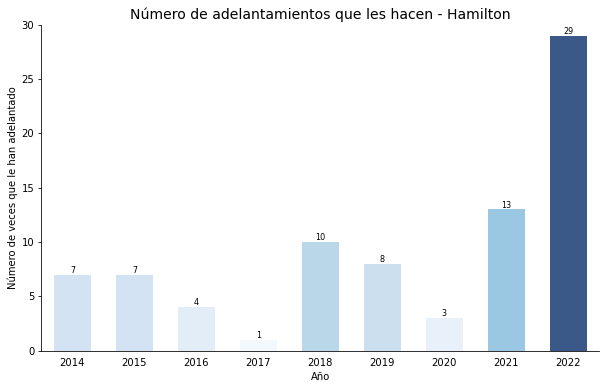

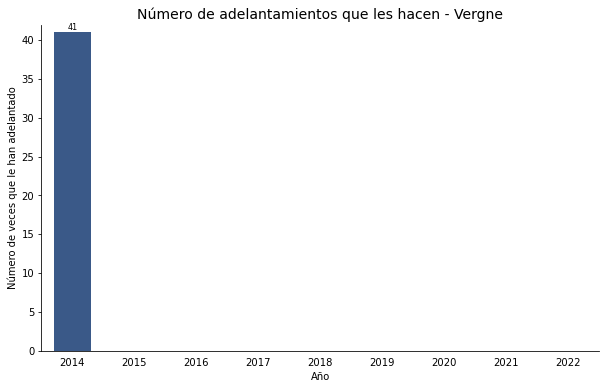

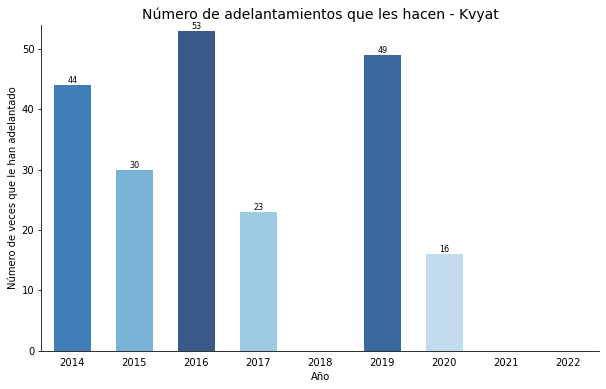

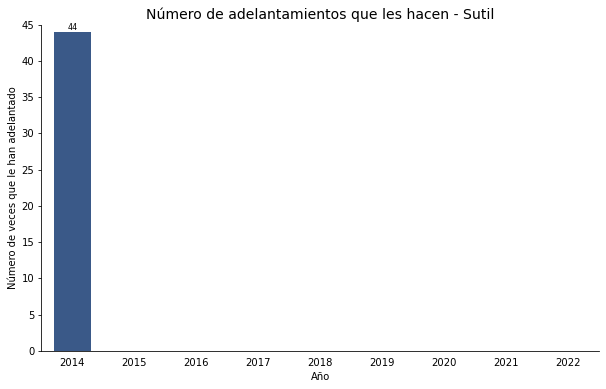

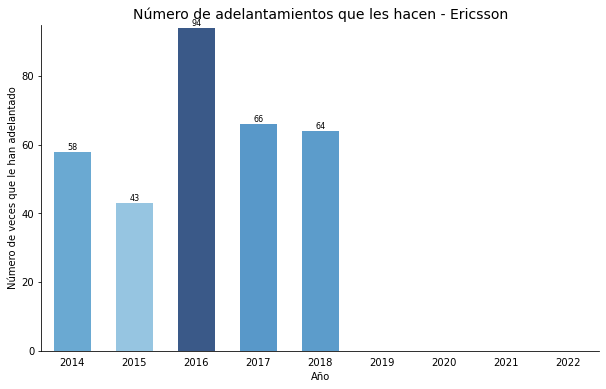

...

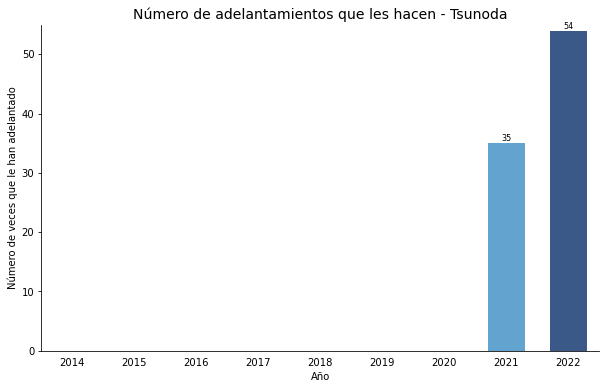

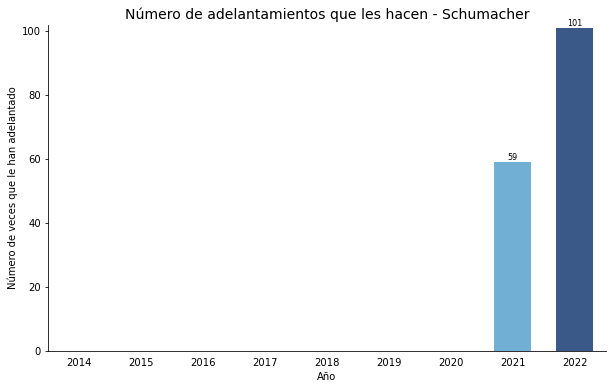

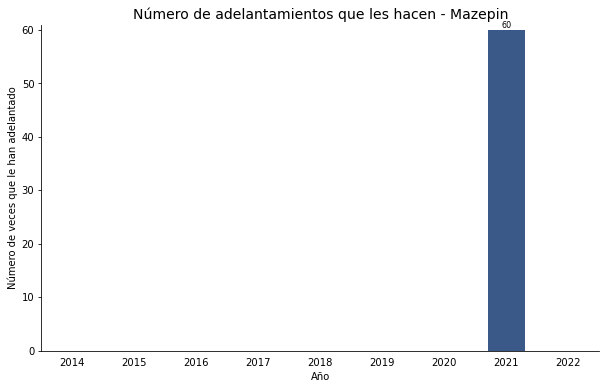

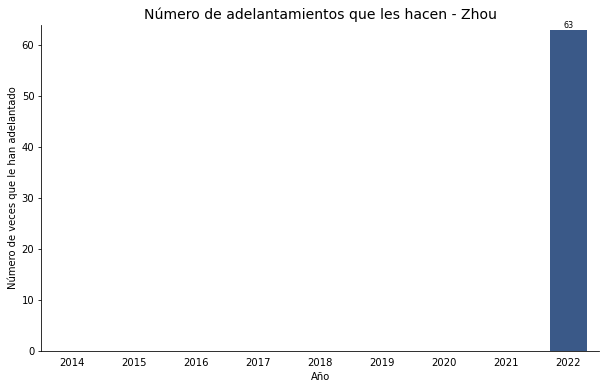

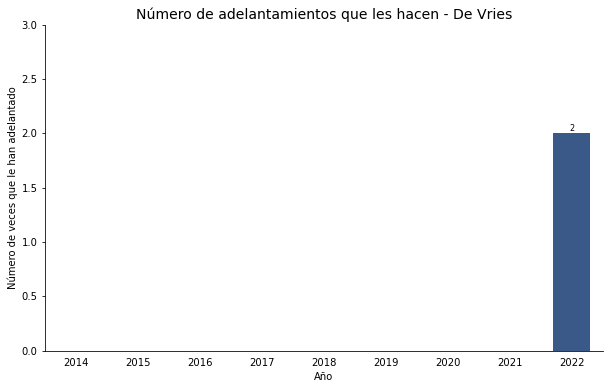

In [24]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Leer los datos de adelantamientos para cada año y almacenarlos en DataFrames
years = range(2014, 2023)
dfs = []

for year in years:
    filename = f'{year}_overtakes.csv'
    df = pd.read_csv(filename, delimiter=',')
    df['Año'] = year
    dfs.append(df)

# Combinar todos los DataFrames en uno solo
df = pd.concat(dfs)

# Obtener la lista de pilotos únicos
lista_pilotos = df['Overtaken'].unique()

# Configuración de colores para las barras
colormap = plt.cm.get_cmap('Blues')  # Paleta de colores (se puede cambiar a otra)

# Generar un gráfico para cada piloto
for piloto in lista_pilotos:
    frequencies = df[df['Overtaken'] == piloto]['Año'].value_counts().sort_index()

    # Configuración de la figura y los ejes
    fig, ax = plt.subplots(figsize=(10, 6))  # Aumentar el tamaño de la figura

    # Barra de colores basada en el número de adelantamientos
    colors = colormap(frequencies.values / max(frequencies.values))

    # Gráfico de barras con ajustes para mostrar todos los años
    ax.bar(frequencies.index, frequencies.values, color=colors, alpha=0.8, width=0.6)

    # Configuración de los ejes y el título
    ax.set_xlabel('Año')
    ax.set_ylabel('Número de veces que le han adelantado')
    ax.set_title(f'Número de adelantamientos que les hacen - {piloto}', fontsize=14)  # Aumentar el tamaño del título

    # Ajustar el tamaño de las gráficas para mostrar todos los años y adelantamientos
    ax.set_xlim(min(years) - 0.5, max(years) + 0.5)
    ax.set_ylim(0, max(frequencies.values) + 1)

    # Mostrar los valores de los años en el eje x y eliminar los ticks sobrantes
    ax.set_xticks(years)
    ax.set_xticklabels(years)  # Mostrar los años en el eje x
    ax.tick_params(axis='x', which='both', bottom=False, top=False)
    ax.xaxis.set_tick_params(width=0)

    # Añadir el año correspondiente debajo de cada barra
    for x, y in zip(frequencies.index, frequencies.values):
        ax.annotate(y, (x, y), ha='center', va='bottom', fontsize=8)
        ax.annotate(x, (x, -0.3), ha='center', va='top', fontsize=8, color='gray')  # Añadir el año debajo de la barra

    # Eliminar los ticks del eje y derecho y las etiquetas del eje x
    ax.tick_params(axis='y', which='both', right=False)
    ax.xaxis.set_tick_params(labelbottom=True)  # Mostrar las etiquetas del eje x

    # Ocultar los marcos de los ejes
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    # Mostrar la gr

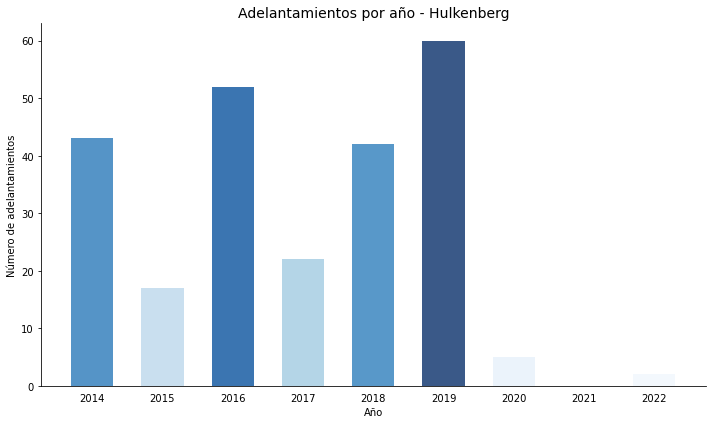

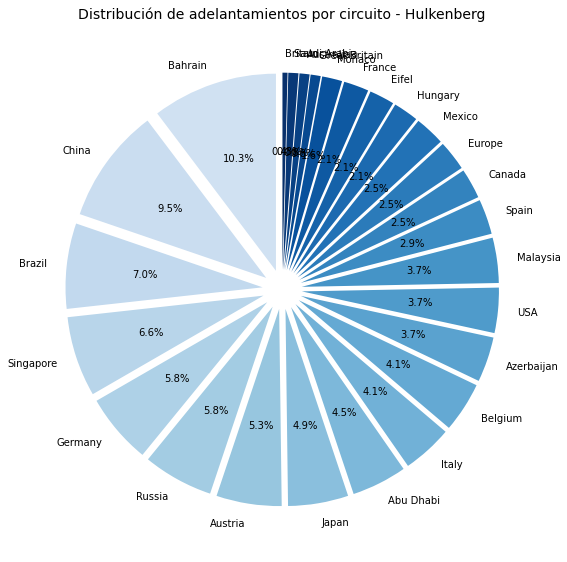

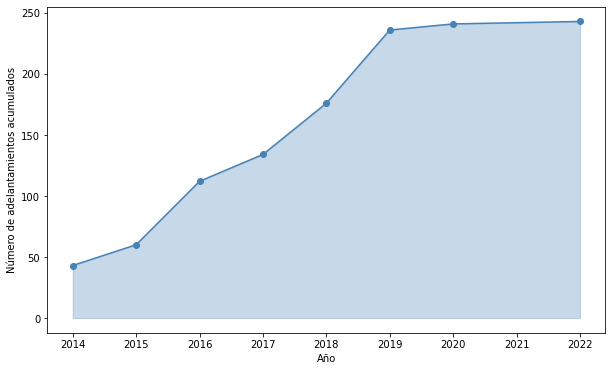

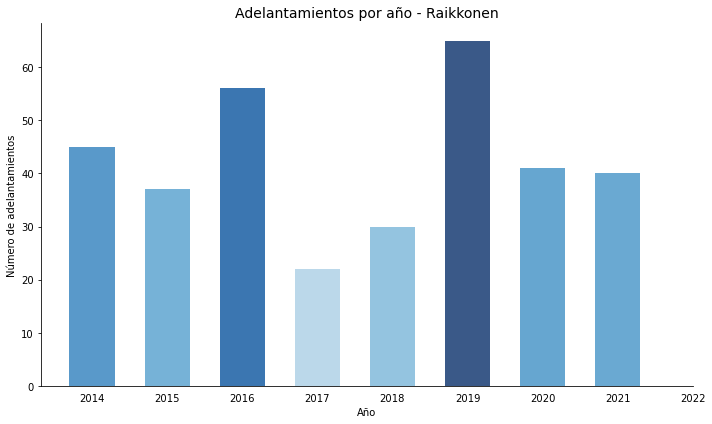

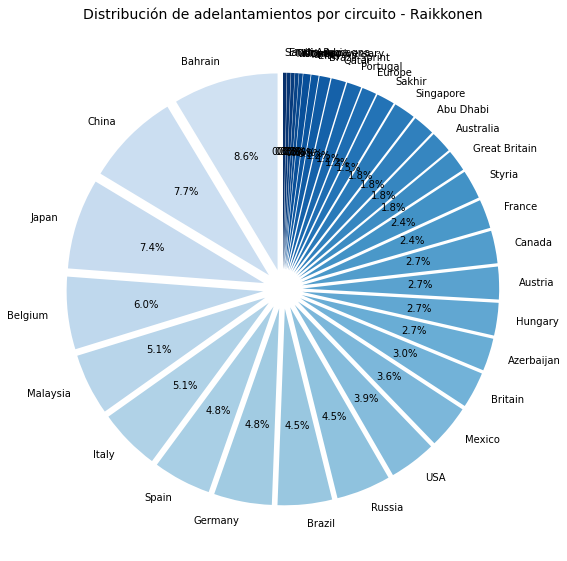

...

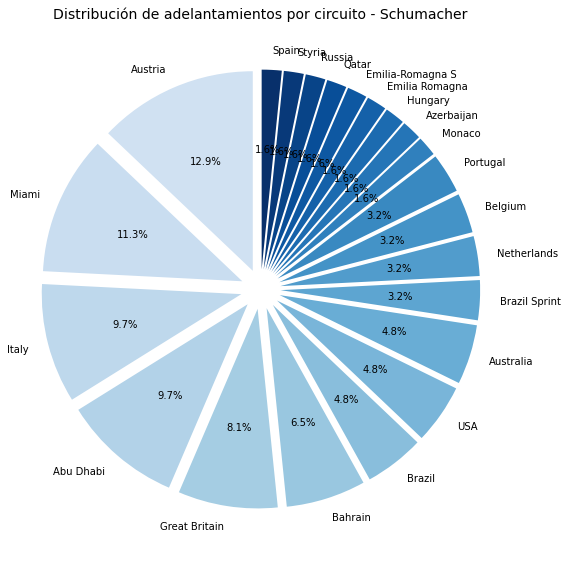

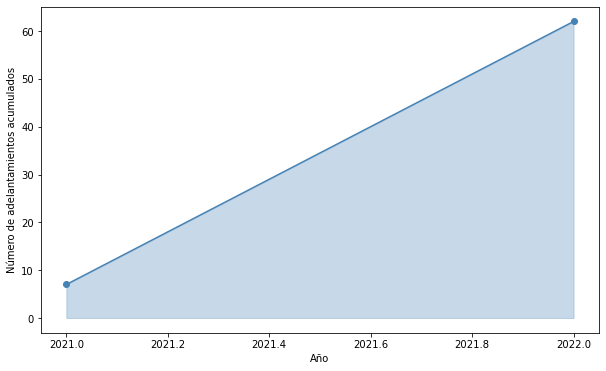

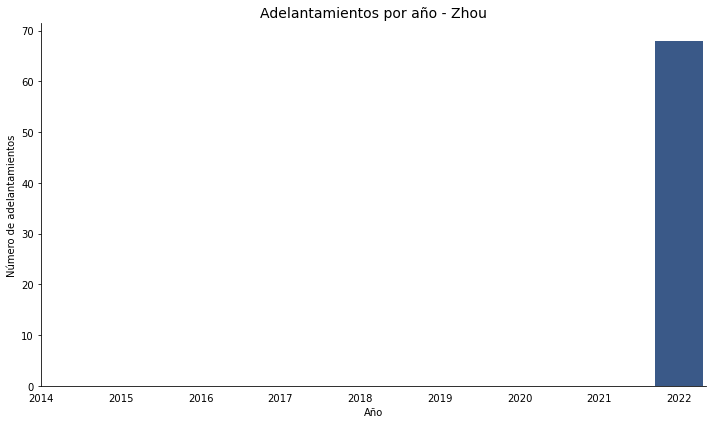

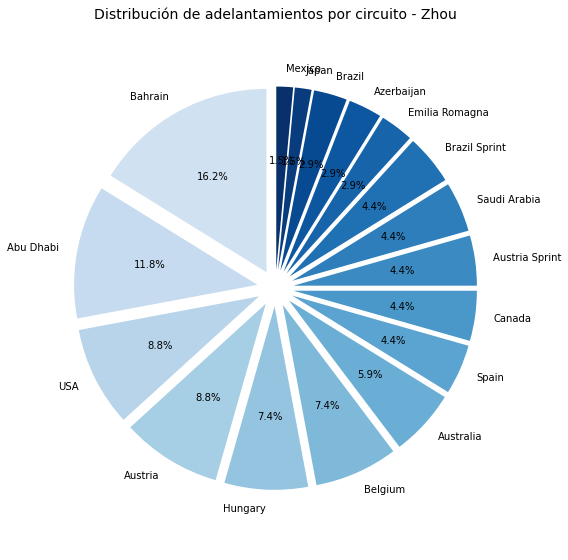

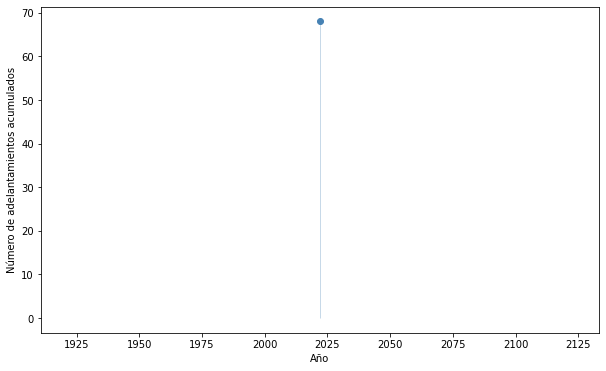

In [25]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Leer los datos de adelantamientos para cada año y almacenarlos en DataFrames
years = range(2014, 2023)
dfs = []

for year in years:
    filename = f'{year}_overtakes.csv'
    df = pd.read_csv(filename, delimiter=',')
    df['Año'] = year
    dfs.append(df)

# Combinar todos los DataFrames en uno solo
df = pd.concat(dfs)

# Obtener la lista de pilotos únicos
lista_pilotos = df['Overtaker'].unique()

# Configuración de colores para las barras
colormap = plt.cm.get_cmap('Blues')  # Paleta de colores (se puede cambiar a otra)

# Generar gráficas útiles y profesionales para cada piloto
for piloto in lista_pilotos:
    # Filtrar datos para el piloto actual
    piloto_df = df[df['Overtaker'] == piloto]

    # Gráfico de barras de adelantamientos por año
    fig, ax = plt.subplots(figsize=(10, 6))
    frequencies = piloto_df['Año'].value_counts().sort_index()
    colors = colormap(frequencies.values / max(frequencies.values))
    ax.bar(frequencies.index, frequencies.values, color=colors, alpha=0.8, width=0.6)
    ax.set_xlabel('Año')
    ax.set_ylabel('Número de adelantamientos')
    ax.set_title(f'Adelantamientos por año - {piloto}', fontsize=14)
    ax.set_xticks(years)
    ax.set_xticklabels(years)
    ax.tick_params(axis='x', which='both', bottom=False, top=False)
    ax.xaxis.set_tick_params(width=0)
    ax.tick_params(axis='y', which='both', right=False)
    ax.xaxis.set_tick_params(labelbottom=True)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    plt.tight_layout()
    plt.show()

    # Gráfico de pastel de adelantamientos por circuito
    fig, ax = plt.subplots(figsize=(8, 8))
    circuito_counts = piloto_df['Race'].value_counts()
    explode = [0.1] * len(circuito_counts)  # Destacar cada segmento
    ax.pie(circuito_counts.values, labels=circuito_counts.index, autopct='%1.1f%%', explode=explode, startangle=90,
           colors=colormap(np.linspace(0.2, 1, len(circuito_counts))))
    ax.axis('equal')
    ax.set_title(f'Distribución de adelantamientos por circuito - {piloto}', fontsize=14)
    plt.tight_layout()
    plt.show()

    # Gráfico de líneas de adelantamientos acumulados por año
    fig, ax = plt.subplots(figsize=(10, 6))
    accumulative = piloto_df['Año'].value_counts().sort_index().cumsum()
    ax.plot(accumulative.index, accumulative.values, marker='o', linestyle='-', color='steelblue')
    ax.fill_between(accumulative.index, accumulative.values, color='steelblue', alpha=0.3)
    ax.set_xlabel('Año')
    ax.set_ylabel('Número de adelantamientos acumulados')


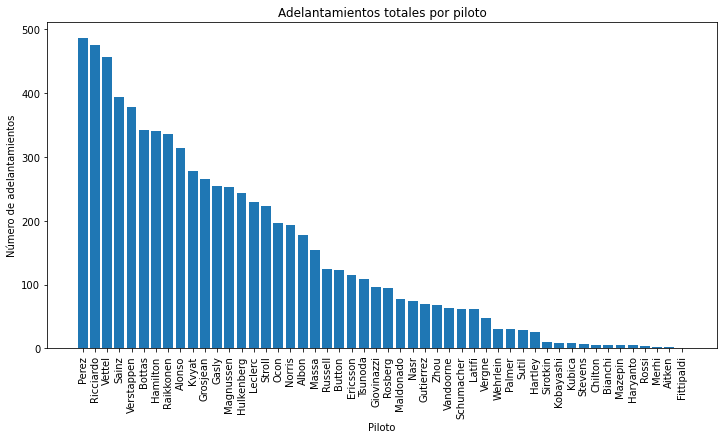

<Figure size 432x288 with 0 Axes>

In [26]:
# Obtener el número total de adelantamientos por piloto
adelantamientos_totales = df['Overtaker'].value_counts()

# Crear el gráfico de barras
plt.figure(figsize=(12, 6))
plt.bar(adelantamientos_totales.index, adelantamientos_totales.values)
plt.xlabel('Piloto')
plt.ylabel('Número de adelantamientos')
plt.title('Adelantamientos totales por piloto')
plt.xticks(rotation=90)
plt.show()

# Guardar el gráfico en un archivo
plt.savefig('Adelantamientos_por_piloto.png', dpi=300)



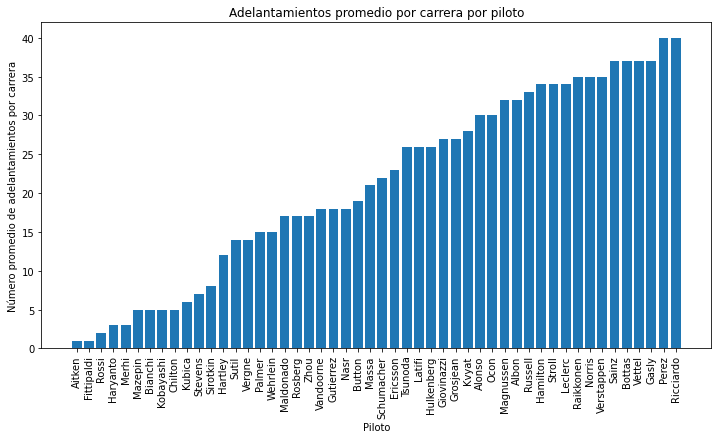

<Figure size 432x288 with 0 Axes>

In [27]:
# Obtener el número promedio de adelantamientos por carrera por piloto
adelantamientos_promedio = df.groupby('Overtaker')['Race'].nunique().sort_values()

# Crear el gráfico de barras
plt.figure(figsize=(12, 6))
plt.bar(adelantamientos_promedio.index, adelantamientos_promedio.values)
plt.xlabel('Piloto')
plt.ylabel('Número promedio de adelantamientos por carrera')
plt.title('Adelantamientos promedio por carrera por piloto')
plt.xticks(rotation=90)
plt.show()
plt.savefig('Adelantamientos_promedio_por_carrera.png', dpi=300)

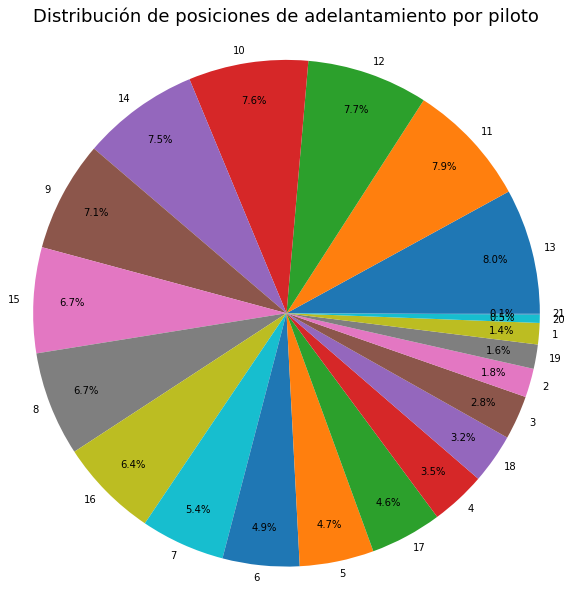

<Figure size 432x288 with 0 Axes>

In [28]:
# Obtener la distribución de posiciones de adelantamiento por piloto
posiciones_adelantamiento = df['Position'].value_counts()

# Crear el gráfico de pastel
plt.figure(figsize=(10, 10))
plt.pie(posiciones_adelantamiento.values, labels=posiciones_adelantamiento.index, autopct='%1.1f%%', pctdistance=0.85, labeldistance=1.05)
plt.axis('equal')
plt.title('Distribución de posiciones de adelantamiento por piloto', fontsize=18, pad=20)
plt.show()
plt.savefig('Distribucio_adelantamiento_posiciones.png', dpi=300)


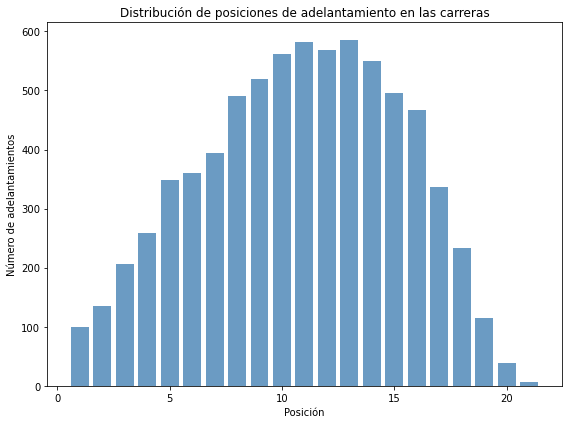

<Figure size 432x288 with 0 Axes>

In [29]:
# Calcular la distribución de posiciones de adelantamiento
posiciones_adelantamiento = df['Position'].value_counts()

plt.figure(figsize=(8, 6))
plt.bar(posiciones_adelantamiento.index, posiciones_adelantamiento.values, color='steelblue', alpha=0.8)
plt.xlabel('Posición')
plt.ylabel('Número de adelantamientos')
plt.title('Distribución de posiciones de adelantamiento en las carreras')
plt.tight_layout()
plt.show()

plt.savefig('Histograma_distribucion_adelantamientos.png', dpi=300)

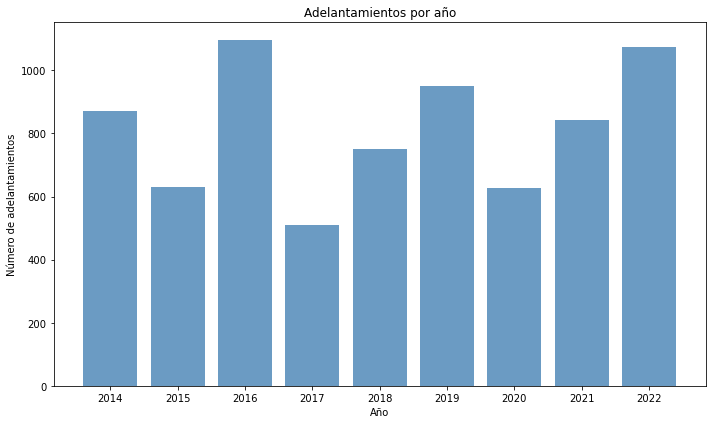

<Figure size 432x288 with 0 Axes>

In [30]:
# Gráfico de barras de adelantamientos por año
adelantamientos_por_año = df['Año'].value_counts().sort_index()

plt.figure(figsize=(10, 6))
plt.bar(adelantamientos_por_año.index, adelantamientos_por_año.values, color='steelblue', alpha=0.8)
plt.xlabel('Año')
plt.ylabel('Número de adelantamientos')
plt.title('Adelantamientos por año')
plt.xticks(adelantamientos_por_año.index)
plt.tight_layout()
plt.show()
plt.savefig('adelantamientos_año.png', dpi=300)

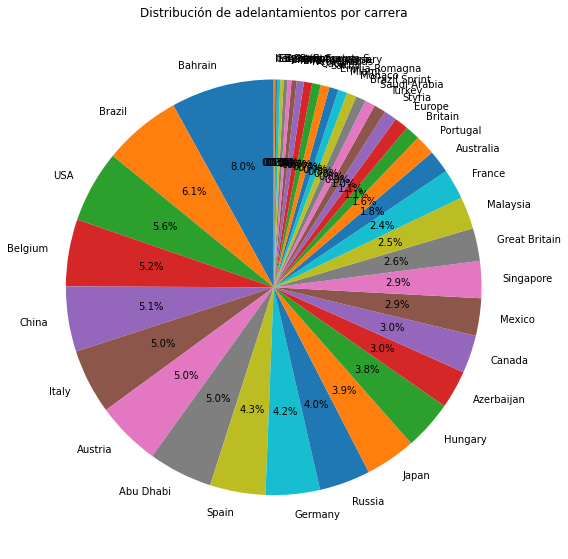

<Figure size 432x288 with 0 Axes>

In [34]:
# Gráfico de pastel de adelantamientos por carrera
adelantamientos_por_carrera = df['Race'].value_counts()

plt.figure(figsize=(8, 8))
plt.pie(adelantamientos_por_carrera.values, labels=adelantamientos_por_carrera.index, autopct='%1.1f%%', startangle=90)
plt.axis('equal')
plt.title('Distribución de adelantamientos por carrera')
plt.tight_layout()
plt.show()
plt.savefig('adelantamientos_carrera.png', dpi=300)


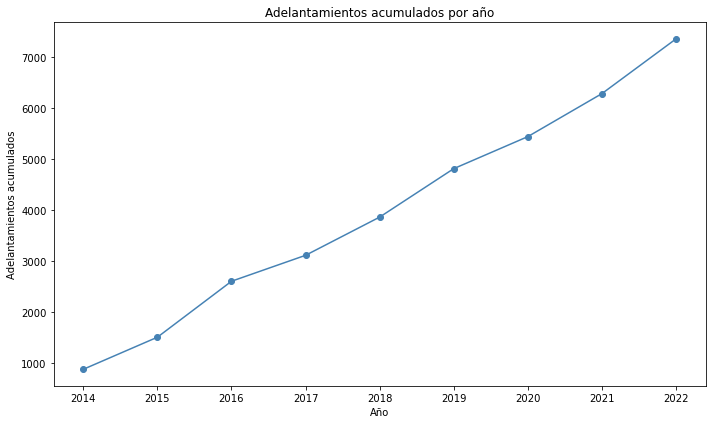

<Figure size 432x288 with 0 Axes>

In [33]:

# Gráfico de líneas de adelantamientos acumulados por año
adelantamientos_acumulados = adelantamientos_por_año.cumsum()

plt.figure(figsize=(10, 6))
plt.plot(adelantamientos_acumulados.index, adelantamientos_acumulados.values, marker='o', color='steelblue')
plt.xlabel('Año')
plt.ylabel('Adelantamientos acumulados')
plt.title('Adelantamientos acumulados por año')
plt.xticks(adelantamientos_por_año.index)
plt.tight_layout()
plt.show()

plt.tight_layout()
plt.savefig('adelantamientos_año_acumulado.png', dpi=300)


